In [1]:
#Basic libraries
import pandas as pd 
import numpy as np 

In [2]:
import matplotlib.pyplot as plt

In [3]:
raw_reviews = pd.read_csv('D:\Bhuvaneshwaran American College\work 6\Text Mining using Sentiment Analysis\Dataset and Link/Musical_instruments_reviews.csv')

In [4]:
raw_reviews.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [5]:
# print shape of dataset with rows and columns and information 
print ("The shape of the  data is (row, column):",raw_reviews.shape)

The shape of the  data is (row, column): (10261, 9)


In [6]:
print (raw_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10261 entries, 0 to 10260
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   reviewerID      10261 non-null  object 
 1   asin            10261 non-null  object 
 2   reviewerName    10234 non-null  object 
 3   helpful         10261 non-null  object 
 4   reviewText      10254 non-null  object 
 5   overall         10261 non-null  float64
 6   summary         10261 non-null  object 
 7   unixReviewTime  10261 non-null  int64  
 8   reviewTime      10261 non-null  object 
dtypes: float64(1), int64(1), object(7)
memory usage: 721.6+ KB
None


In [7]:
#Creating a copy
process_reviews=raw_reviews.copy()

In [8]:
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [9]:
#Checking for null values
process_reviews.isnull().sum()

reviewerID         0
asin               0
reviewerName      27
helpful            0
reviewText         7
overall            0
summary            0
unixReviewTime     0
reviewTime         0
dtype: int64

In [10]:
process_reviews['reviewText']=process_reviews['reviewText'].fillna('Missing')

In [11]:
process_reviews.isnull().sum()

reviewerID         0
asin               0
reviewerName      27
helpful            0
reviewText         0
overall            0
summary            0
unixReviewTime     0
reviewTime         0
dtype: int64

In [12]:
process_reviews['reviewerName']=process_reviews['reviewerName'].fillna('Missing')

In [13]:
process_reviews.isnull().sum()

reviewerID        0
asin              0
reviewerName      0
helpful           0
reviewText        0
overall           0
summary           0
unixReviewTime    0
reviewTime        0
dtype: int64

In [14]:
# Concatenating review text and summary
process_reviews['reviews']=process_reviews['reviewText']+process_reviews['summary']
process_reviews=process_reviews.drop(['reviewText', 'summary'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...


In [15]:
#Figuring out the distribution of categories
process_reviews['overall'].value_counts()

5.0    6938
4.0    2084
3.0     772
2.0     250
1.0     217
Name: overall, dtype: int64

In [16]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [17]:
Text=process_reviews['reviews']

In [18]:
import nltk
nltk.downloader.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\S3-TECH\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [19]:
#Analysing the sentiment score
sid = SentimentIntensityAnalyzer()
for sentence in Text:
     print(sentence)
        
     ss = sid.polarity_scores(sentence)
     for k in ss:
         print('{0}: {1}, ' .format(k, ss[k]), end='')
     print()

Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good
neg: 0.057, neu: 0.79, pos: 0.153, compound: 0.6903, 
The product does exactly as it should and is quite affordable.I did not realized it was double screened until it arrived, so it was even better than I had expected.As an added bonus, one of the screens carries a small hint of the smell of an old grape candy I used to buy, so for reminiscent's sake, I cannot stop putting the pop filter next to my nose and smelling it after recording. :DIf you needed a pop filter, this will work just as well as the expensive ones, and it may even come with a pleasing aroma like mine did!Buy this product! :]Jake
neg: 0.0, neu: 0.845, pos: 0.155, compound: 0.942, 
The primary job of this device is to block the breath that would otherwi

neg: 0.0, neu: 0.731, pos: 0.269, compound: 0.9734, 
I have had one for two years and no complaints, needed another for my travel guitar.  The lever arm is coated with a soft plastic sleeve which protects the neck, the spring is firm and in 2 years has not given up any tension. Finally on the string compression side the material is firm yet supple.  I take particular caution to make sure that I don't leave it on anything that would indent that material permanently...Works well
neg: 0.09, neu: 0.812, pos: 0.098, compound: -0.0905, 
I've seen and used many different types of capos over the years and they range from the very cumbersome and difficult to use to the easily breakable but I've never used one as convenient and as well constructed as this Kyser one.  It is by far the best I've ever seen and I've been using it for years now and it still works fine.  It makes moving the capo quickly a cinch and the gold doesn't corrode or tarnish making it look like new even after all these years.

neg: 0.07, neu: 0.733, pos: 0.197, compound: 0.9996, 
Here's the deal with this pedal. It is inexpensive and you can get a better pedal with barely a bit more money and sometimes a little less money. In my opinion, for spending less than $100 for a distortion pedal, whether it is your first pedal or 700th pedal, a few more bucks will get you the MXR Badass distortion which has a much crisper tone to it.Beginners Beware
neg: 0.024, neu: 0.931, pos: 0.044, compound: 0.3182, 
This is a little more expensive than some other brands, but i think it sounds great and it's way more durable than a plastic pedal.I'm pretty new to electric guitar so i'm not really a distortion and tone expert like some other reviewers.  To me this this sounds better and is easier to adjust than my modeling amp, so I think it's a good purchase.Nice pedal
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.9798, 
This is the best deal ever my first pedal was a zoom 505 gfx and it was really electronic and synthesized soun

neg: 0.0, neu: 0.852, pos: 0.148, compound: 0.6114, 
Rugged ends very flexible seem like this cable should hold up very well , does not tangle which is a real plus if you tend to move around a lot , connectors seem to be heavy duty , time will tell but I would assume that this cable should last a long time .Great Cable
neg: 0.0, neu: 0.803, pos: 0.197, compound: 0.8697, 
After suffering through crackles, lost signals, and all the rest, I decided to heed the numerous positive reviews of the Spectraflex tweed cable and purchase one through Amazon.com.  Because the new acoustic-electric classical I received as a gift has an end-pin outlet, I bought the Spectraflex with the right angle connector.  Although I have been using the cable for only a few weeks, I am very impressed.  The connections on all the guitars and basses on which I've used it are sure, with no loss of signal, no crackles.  Perhaps most impressive is the fact that I can turn the right angle connector around and never have 

neg: 0.052, neu: 0.832, pos: 0.116, compound: 0.7247, 
I tried three of these on a whim and they impressed me favorably. In fact, they were so good that I purchased ten more when I went back to the same music store. My favorites are mandolin picks like Golden Gate or Grisman "Dawgs". The round side of the XH Dunlop Gels gives me a similar attack and a nice warm tone. I would recommend these to anyone.Much better than average!
neg: 0.038, neu: 0.657, pos: 0.306, compound: 0.964, 
If for some reason you're looking for a pick with a specific color, this is a nice set. The bright colors make them difficult to lose.Nice picks if you're looking for specific colors
neg: 0.071, neu: 0.767, pos: 0.162, compound: 0.4939, 
I have used the Extra Heavy picks for many years but am still searching for that perfect pick. Its strong enough to play metal and some blues style rifts but not so strong it cracks and brakes. I do like the fact it wont turn to powder or fray while playing either but it does w

neg: 0.133, neu: 0.619, pos: 0.247, compound: 0.5699, 
What can I say, they are Ernie Ball Slinky strings. I've been using Slinkys on my acoustics and electrics for 40 years and they have never let me down- (Unlike some of the higher priced strings) I might add. Very responsive and never dull or weak sounding. Crisp highs and smooth lows that don't get &#34;mudded&#34; out. I would recommend these to anyone to at least try a set on your acoustic guitar and Ernie Ball Super Slinkys on your electric guitar. Still, after all of these years and innovations in strings, Ernie Ball still gets my vote hands down!!Great Slinky's as always!!
neg: 0.016, neu: 0.847, pos: 0.137, compound: 0.922, 
I originally purchased these strings because of the 11-52 gauges. I wanted a set of strings that would have slightly lighter tension than a regular set of light gauge which is usually somewhere around 12-54. Upon installing these strings, I can't really see much difference in size from the regular light g

neg: 0.047, neu: 0.814, pos: 0.139, compound: 0.9881, 
I kinda strayed away from the Elixir brand for a little while just "To See" if another brand would sound "better" and in doing so, I wasted time and money.(but I did get some EXPERIENCE) I'm back with the Elixirs now and have no intentions to "Experiment" any more.Simply put............Elixir makes the best Strings for an Acoustic Guitar that I've tried and I "Will Stick with them" because they have Great Sound, last a long time, easy to clean and prevent rust and/or corrosion.Simply.......Great !
neg: 0.068, neu: 0.767, pos: 0.165, compound: 0.8392, 
I use mediums but bought these for my nephews Takamine and they sound awesome on that guitar.  Always love these strings.  This kid has not changed his strings in years so I thought I would give hem the best chance of keeping his guitar sounding good for as long as possible.Great
neg: 0.0, neu: 0.646, pos: 0.354, compound: 0.979, 
These strings are a little more money than the average

neg: 0.054, neu: 0.751, pos: 0.195, compound: 0.9922, 
I'm a little surprised at this one. Just today I was emailed confirmation that the picks were shipped, and I found them in my mail box the same day. I like fender mediums because I use them on both bass and guitar. Good picks! Clean edges, good feel, good duribility, nice tone.good picks, decent price, fast service
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.9485, 
Originally received the wrong item, but I contacted customer service and they returned my email that night (on a Sunday) and said they would ship out the correct product the next morning.  I received the correct item in one day as well as a postage paid envelope to return the incorrect picks.  Great customer service, and love the pics...the color in the pictures doesn't do it justice!Great customer service
neg: 0.026, neu: 0.788, pos: 0.186, compound: 0.9365, 
These pics are perfect for a jazz guitarist, and I actually like the coloration too.  The Ocean Turquoise wasn

neg: 0.011, neu: 0.819, pos: 0.171, compound: 0.993, 
I can't do more than underscore the endorsement of this mic by the previous reviewer (FOX).  If you haven't started in the mic-collecting business, trying every trendy dynamic and condenser mic in the hundred dollar range and below, you might actually save some bucks by cutting directly to the chase and going for this one.  I've always wondered why I can't reproduce the sounds of our local NPR outlet, and I finally realize it's because they have the Shure SM7B and I don't.It enhances the voice with depth and richness and filters out the pops and unwanted percussives (face it, those separate pop filters are cumbersome to use).  It's very directional and "selective" (rejecting room ambience and background noise), so it's perhaps not the ideal mic for all applications.  But for announcing, broadcasting, vocal performance and vocal recording, I don't see how anything could possibly equal let alone surpass it.The Grail
neg: 0.046, neu: 0

neg: 0.028, neu: 0.841, pos: 0.131, compound: 0.5927, 
This music stand is og great quality and of a great price.I have been very pleased with it. I have bought On-Stage stands in the past before, so i was sure that I wouldn't be disaapointed and I was right.Very sturdy-well built-good price.excellent music stand
neg: 0.0, neu: 0.72, pos: 0.28, compound: 0.9322, 
I purchased this model for home use--not for a kid's backpack. It's solid and sturdy, easily holding a song book open--not just a few pieces of sheet music. It adjusts tall enough for standing as well as low enough to sit next to my easy chair in the evening. I often clip on a digital recorder for practice and have no threat of the top flipping down. Works for me!Solid.
neg: 0.103, neu: 0.749, pos: 0.148, compound: 0.3382, 
I'm very happy with this stand.  It is heavy, which I knew going in.  But for my purposes, that is a plus.  The weight makes it more sturdy.  It folds up compactly, so it is quite portable, despite the weig

neg: 0.046, neu: 0.827, pos: 0.127, compound: 0.5962, 
I love this little item.  I was reluctant sticking anything on my nice new Fender but I love it.  No more hunting for picks anymore.  When I am through playing a just slide my pick back into the holder and it's always there when I pick up the guitar.Placement is everything though so think it out before you just stick in on your guitar.  I placed mine where I'd never rub against it, between the amp cord inlet and a control knob.  Make sure it isn't in the way of your strumming or any place your body will rub against it.I love this and have one coming for my acoustic too, only it is the wood grain version to match the wood on the guitar.Oh, I use medium picks and fit 7 easily into the holder and wouldn't try to squeeze another on in, but that's why you have a gig bag anyway.  This is a must have item, in my opinion.Already on my Fender Stratocaster
neg: 0.024, neu: 0.819, pos: 0.157, compound: 0.9762, 
I use Clayton 1.26mm picks, a h

neg: 0.051, neu: 0.76, pos: 0.189, compound: 0.9937, 
It is taking a chance on ordering a guitar online!I took the chance and got what most of the reviews already shared.Here's my take-PROS:- Cheap! $90 is very inexpensive for a guitar!- Well packaged for shipping- Arrived 1 day early- Fair quality. This is not a top of the line or even middle of the line guitar. It is a cheap guitar that does have some decent craftsmanship, but not stellar.- Good sound! This does have a very good sound- with new strings of course- Size: This is not a full size guitar, but larger than a 3/4. It is a "concert" size which I like!- It is a cut-away design without electronics! This combo is very rare!- Fair to good wood materials and furniture- Good design! This guitar sounds good, feels good, looks very good.- Matte finish: this comes with a matte finish, not shiny- I like thatCONS:- Strings- corroded poor quality strings- neck condition: Neck has slight bend, I needed to adjust the truss and file a few f

neg: 0.076, neu: 0.717, pos: 0.206, compound: 0.8037, 
Anyone who plays a lot know that strings are very much a personal thing.  The tonal qualities, weight, feel, materials and all other qualities / variables combine to make strings your very own personal favorite.  For me these strings bring it all together and are my string of choice for all 12 acoustic electrics I use to play what I consider rock ballads using my strumming-style of play.I love the feel and tone of these strings for my style of play and my equipment set-up.  I do have some issues with these strings, but overall, I'm willing to put up with the issues for the overall performance I get from the EJ26 strings.  The issues include what I think may be premature breakage.  I do not play &#34;hard&#34;, I play long (playing several hours daily), but I play rock ballads using a somewhat softer strumming style.  (I definitely do not &#34;pound&#34; on the strings - I like to think of it as fairly &#34;gentle&#34; strumming.)  

neg: 0.063, neu: 0.825, pos: 0.112, compound: 0.5903, 
They have slightly more of a nickel finish than chrome and look way better, and they give u some spares.Ex-cell-ant!!!
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.5826, 
these Fender pickguard screws are excellent, they work well with any project you may be doing at the moment, I replaced these with the squier standard screws on my strat and they're much better than the ones you get on the squier guitars made better and with a small screw face the keep your axe looking excellentexcellent for any project
neg: 0.099, neu: 0.731, pos: 0.17, compound: 0.7783, 
Pretty disappointed in the color. As the review title indicates, what I received is more of a 'black chrome' or dingy stainless color. These are simply not going to work with the MOTS pickguard I purchased them for. Perhaps they would blend in better on a black, black pearl or tort pickguard.I ordered another package from another vendor and got the same result. Perhaps it is a 

neg: 0.0, neu: 0.721, pos: 0.279, compound: 0.8519, 
Lemon has been known for quite some generations to be a good cleaning solvent because of its acidic nature and this certainly does the job. As the label warns: do NOT to use on Maple-wood frets (mostly Fender strats) due to the softer & lighter quality. It is only for the harder, darker woods like mahogany (which I have) or ebony (high quality - i.e. expensive - used best for fretless). The solution is perfect, but the applicator (attached to the neck of the bottle) could be better. I would rather take the neck applicator out and apply lightly using a 100% cotton cloth.This solution has been made specifically for use on guitars, though I think you could find a similar lemon oil cleaner cheaper at local stores. It's only 4-oz, but what little is used each time, this bottle should last the guitar owner his/her life.Cleans real good
neg: 0.008, neu: 0.832, pos: 0.16, compound: 0.9669, 
This is a lemon oil used for cleaning and condition

neg: 0.0, neu: 0.898, pos: 0.102, compound: 0.6761, 
Easy to take apart, to put together, to store, and pretty stable when in use. Not the cheapest but worth the money.Good space saver.
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.7184, 
Strong and won't tip.price is very affordable.I own several and have had no trouble with them.Buy it and you will see.great stand
neg: 0.18, neu: 0.699, pos: 0.121, compound: -0.1531, 
No much to these things, but they are cheap and they work great in the studio.  They shipped quickly and didn't break the bank.Great price on a necessity in the studio.
neg: 0.045, neu: 0.794, pos: 0.16, compound: 0.7227, 
For the price you cannot go wrong with this.  Holds my Les Paul and feels secure.  I've never had any issues with this.  Don't bother spending 3-4x as much for something that does the job as well as this.EDIT - Bought another one this Christmas for another guitar and this one feels as good and as simple as the first one.Great budget guitar stand
neg: 

neg: 0.095, neu: 0.78, pos: 0.125, compound: 0.8141, 
This could be used for lightweight microphones but don't bother wasting your money if you're using a studio microphone. The base has a small circumference, so you can't stick the boom out very far at all, almost useless. There are better deals for just slightly more money. Or if you really want near studio quality, try the Samson studio boom mic stands.Too cheap.
neg: 0.046, neu: 0.795, pos: 0.159, compound: 0.7858, 
I use this for my home recording studio. This stand is versatile enough to be used at almost any angle. From playing and singing piano, recording guitar and vocals, and other various positions. Sometimes hard to keep the mic firmly in place but that may be a function of my shock mount.Cheap and highly recommended.Great Mic Stand.
neg: 0.079, neu: 0.897, pos: 0.024, compound: -0.4939, 
I like the stand. It makes my recording convenient. It is well built. The adjustable parts are easy to use.Nice stand
neg: 0.0, neu: 0.69

neg: 0.049, neu: 0.852, pos: 0.099, compound: 0.9677, 
If you are like me and truly value your (usually) expensive prized instruments, then you want to make sure nothing happens to them, accidentally or otherwise. The Hercules stands are much much more stable than all the rest. They have a better base design, and even when the stand inevitably gets bumped there is no wobbling, no worries - just make sure you lower it all the way, as it is designed to be.These things are awesome. Also, everything fits so perfectly on Hercules stands. All of the other tri-stands lean your instruments in toward the top too much and cause the headstocks to bang together. Not here, plenty of room for everything now. This stand (and the double version which I also own) lets your gear hang down perfectly straight and protects it all with those very thickly padded stops you see near the base in the picture. Also, the hanging gravity grasp around the neck is so sweet. With all other stands I am always worried t

neg: 0.054, neu: 0.899, pos: 0.046, compound: 0.041, 
Simple and useful rack stand. Easy to assemble. Easy to mount rack components... but the rubber leg terminals are easy to lose too. A little more interest in the manufacture means more quality.Simple and useful rack stand... but the rubber leg terminals are easy to lose
neg: 0.11, neu: 0.558, pos: 0.332, compound: 0.9235, 
This is exactly the item I needed for my podcasting rig.  It holds my Behringer mixer along with my compressor and my vocal processing box.  It lets me move the whole thing easily out of the way when I need to use my table for something besides podcasting.The stand is easy to assemble and is very well built.  There's nothing bad I can say about it, if you need to hold some audio gear then have no reservations about picking one of these up.  Highly recommended.Solid Stand - Perfect For Podcasting Rig
neg: 0.052, neu: 0.802, pos: 0.145, compound: 0.8836, 
This stand is great for my 45lb Peavey 1500. It is a light we

neg: 0.066, neu: 0.836, pos: 0.098, compound: 0.4574, 
Works as advertised for my purpose. It is in front of a computer speaker set (with woofer) for use on a Vizio TV as a sound system.Works fine. I have other Behringer gear and it always works.Using it as an amp for a TV set.
neg: 0.0, neu: 0.956, pos: 0.044, compound: 0.2023, 
I bought this to connect a Technics TT with an Audio Technica cartridge to my newer Onkyo receiver with no phono input. The unit did work but I had to turn the volume to 80 (out of 100) to get any reasonable volume. In addition I have an Onkyo M3040 connected to the receiver that I use for as a zone 2 amplifier. With this preamp I am getting some serious spikes into the amp. They are not audible but the lights would dim and the volume from the zone 2 speakers would drop. I do not have this problem with any other source so it appears to be some signal from this preamp.This unit may work perfectly fine with a Behringer mixer but for my use it doesn't meet my nee

neg: 0.049, neu: 0.773, pos: 0.178, compound: 0.9987, 
I was unsatisfied with the tone from either of my two used solid-state amps, so I ordered a VHT Special Six (supposed to be THE best small tube amp for blues harp), I also ordered a Peavey KB2 (solid state keyboard amp).  Then I ordered this pedal and three others (graphic equalizer; MXR carbon copy delay; T-REX reverb)  I figured that I would find a good tone for both blues and other music from something within this combo.  Well everything is being returned except this pedal.  I found that when I plug this pedal into my old 8 watt Peavey Rage, I get better tone and volume than either of the two new amps using them alone or with any combination of the four pedals.  More "tube-like" sound than a top-rated tube amp! AND...if I want a cleaner tone, I can dial it back, or bypass it altogether.  My only complaint is that it does not accept a battery.  You must use a 9V transformer, which is not included.  Oh well, my experience with the

neg: 0.035, neu: 0.832, pos: 0.134, compound: 0.9819, 
Recently I was looking for some heads to put on a set of Starion shells that I modified. My original plan was to use a set of Attack heads on both the resonant and the batter side of these shells. That decision was based mostly on price. Not completely though as I have used the Attack heads for resonant heads with very good results. The Attack heads that I bought though are single ply. To me that make them great candidates for resonant heads but I think a two ply head is better for a batter head. I gave the Attacks a shot on both sides but I wasn't completely happy with the sound and felt a two ply head would just be the better way to go.In the past I have used Remo heads for batter heads almost exclusively. I still very much like the Remo Pinstripe heads but decided to give these Evans heads a try just to try something different. I am very happy I did! These Starion shells now have a very nice sound with lots of resonance. The mos

neg: 0.027, neu: 0.761, pos: 0.211, compound: 0.9408, 
IDK why GC does not carry these. Annoying. Great pick! Worth buying a baggie. If you like the ultex feel but hate the in store larger only ones, get these.Freaking sweet!
neg: 0.159, neu: 0.553, pos: 0.288, compound: 0.5182, 
Firm pick, just the perfect size and keeps a sharp tip.  Once you try these picks you never go back.Best pick out there.
neg: 0.0, neu: 0.85, pos: 0.15, compound: 0.5719, 
This is a nice pick, thicker and easy to hold on to.  I like the size (smaller than your regular picks) and the tone it allows me to obtain on my guitar.Good one!
neg: 0.0, neu: 0.767, pos: 0.233, compound: 0.8172, 
A very nice pick, both in feel and texture (the design is a bit boring, though). Only complaint is that it's fairly small - about the size of a Canadian or US five cent piece, where most of your typical guitar pick are bigger - about the size of a 25 cent piece. But that's okay. I got this the same time as I got a set of Dava Jaz

neg: 0.044, neu: 0.749, pos: 0.207, compound: 0.9972, 
This 7 band eg. is a great way to change the sound of your guitar. It has more flexability than just a tone knob. It's easy way to get scooped metal or just fine tune the sound of you amp and guitar. Highly recomended!Great eg pedal.
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.8439, 
Product arrived in exactly condition as described by the seller.  This unit allows for great sweeping of frequencies.  the 15 dB pull in each direction for each of the seven bands are filter worthy,  My only dissatisfaction lies in the amount of noise this unit adds to my chain when engaged.  When inactive this unit is transparent, no tone suckage.  When this unit is engaged, each frequency band carves the sounds nicely however, consideration to have this unit modified to reduce its noisy output has begun for me at least.  I am thankful for the internet and the opportunities it presents for me to MOD this Pedal.Used GE7
neg: 0.078, neu: 0.753, pos: 0

neg: 0.022, neu: 0.902, pos: 0.076, compound: 0.532, 
This is another in the MXR "Distortion" line. The Distortion III has a more overdrive flavor than a high gain pedal like the Boss Metal Zone or the Barber Dirty Bomb but is very flexible. Not really for heavy metal (see the MXR 116 Fullbore Metal) but more for that AC/DC and classic rock sound.There is a lot of gain on tap from the output section so it is possible to hit the front of a tube amp hard without turning up the distortion. The tone knob does not have a dramatic sweep but is useable.The good thing about this pedal apart from the price is you do not get that "fizzy" top end that some pedals have when you crank the distortion. In addition, the pedal cleans up nice when you roll back the tone knob.Pedal is hardwired true bypass and very pedal board friendly.MXR does it again.
neg: 0.035, neu: 0.814, pos: 0.152, compound: 0.9645, 
I use this guy with a Fender Twin, since Overdrive sound is not enough for now a days metal. Not 

neg: 0.092, neu: 0.74, pos: 0.169, compound: 0.9286, 
i don't know much about delay and I've never really used it. This is a fun pedal, for a simple cool delay. Kinda makes you aware of what you are playing. Fun with blues/chorus sound! Yep!cool
neg: 0.107, neu: 0.63, pos: 0.263, compound: 0.7707, 
well Behringer!!!,, have to say that the electronics are german mind,, with all that says ,, go figure it out for yourself,, other then that !!.. plastic so i give 4 stars, cuz of the soft plastic case, and the trouble of changing batteries,, but u can use the charger and u will be well off.. sound is really awesome for the money , and it is high standard delay time and sound,, i don't think u can get the german quality anywhere else for 30 bucks,, i say buy it it is a great delay pedal,, and not only the delay most all Behringer effects are sounding great for the money,, can not go wrong..electric fingers
neg: 0.081, neu: 0.747, pos: 0.172, compound: 0.9438, 
This Behringer DD400 delay unit

neg: 0.013, neu: 0.794, pos: 0.193, compound: 0.9782, 
The reverb broke in my amp and I tried the Boss FRV-1 to replace it and didn't really like it too much.  Then I read that a darker analog delay can sort of sound reverby.  This is exactly what I wanted.  It fills out the sound and yet doesn't add any artificial high end.  Sounds gorgeous for what I do, which is playing alone in a basement.  For most songs it's always on, and it really excels at vintagy-sounding stuff like Rockabilly and Surf.  The mod button is a nice add-on but I haven't really bonded with it yet.If I had to buy this over again I might consider the Aqua Puss because I don't use the high delay times all that much and the Aqua Puss has an easy access battery door.Great for reverb-less amps
neg: 0.082, neu: 0.83, pos: 0.088, compound: 0.4058, 
While I've never been a big delay guy, I've always felt my pedal board was missing this particular effect.  I'm definitely not a fan of digital delay, so I did a lot of R&D; on

neg: 0.111, neu: 0.837, pos: 0.053, compound: -0.6557, 
I expected this to be a good mic but it's amazing how much different the quality is over your standard desk mic.The sounds are very clear and crisp
neg: 0.0, neu: 0.677, pos: 0.323, compound: 0.8998, 
I use this microphone mainly to record music. Occasionally I use it for voice chat where it supposedly excels in quality compared to desktop USB microphones. I think the best way to describe this microphone is that it is &#34;above average&#34; but does not outperform any higher-end non-USB microphones that I have played with in the past. While it is not an &#34;outstanding&#34; microphone, it's still a great entry-level product for those on a budget.The microphone is relatively easy to use (just plug in the USB cable) but it needs some accessories to be efficient. For instance, the stand that comes with the microphone cannot hold the microphone upright. It seems like it will tip over if you breathe on it the wrong way. Remember to b

neg: 0.069, neu: 0.787, pos: 0.144, compound: 0.9995, 
Why not? For the price and some reviews I found online, I had to try this pedal.  I bought one myself and it has remained on my pedalboard since I've bought it.  NOTE : I recently put this right after my wah and before my dirt boxes and I've found that it does two things; 1. The vibe sound doesn't get smooshed and retains a more rounded sound and 2. any volume drop you might experience having this after some od/distortion seems to be less.  I suggest playing around and trying this pedal in different places on your pedal chain to see what works best for you.  For me, it will stay before my od pedals and fuzz.  Do yourself a favor and check out some youtube demos of this.  Mine is musicman587....this is the pedal AFTER pedals, but you'll get a good idea of the general settings I use it on.Amazing pedal for the money. Try it!
neg: 0.021, neu: 0.916, pos: 0.064, compound: 0.7652, 
Rugged pedal by a little known company. Took a shot in 

neg: 0.027, neu: 0.816, pos: 0.157, compound: 0.9142, 
This was a great purchase.  A bagful of pretty picks to help my son with his new guitar.  Good thing there were so many in the bag because he seems to keep losing them.  Great price and purchase.Legacy Pearloid Guitar Picks - 60 Assorted (.46MM-1.5MM)
neg: 0.047, neu: 0.647, pos: 0.306, compound: 0.9371, 
Made of leather or high-quality pleather, so it seems built-to-last. I use it on my Seagull and it totally works great. I would definitely recommend, but it's kind of expensive for what it is.Does exactly what it looks like it'll do
neg: 0.0, neu: 0.786, pos: 0.214, compound: 0.8195, 
very smart & handy design that my acoustic guitar doesn't have to be drilled a hole for.  it's very easy to buckle the guitar strap on the neck & its botton button of the guitar, that is!Smart & Handy Design to save a drill into my "Baby"
neg: 0.0, neu: 0.801, pos: 0.199, compound: 0.865, 
I may have misunderstood the product description but I prefer

neg: 0.063, neu: 0.784, pos: 0.154, compound: 0.9865, 
Great mount for the price. Filter attached to mount is great idea, saves space and simplifies mic stand setup. Quality good, especially given fairly low price.Works very well, filter great
neg: 0.054, neu: 0.546, pos: 0.4, compound: 0.9454, 
I'm loving this pop filter! It looks professional in design, and feels very sturdy on the mic stand. The built in shock mount is definitely a plus. I like it because some beginners try to grab the mic in the studio when recording vocals. This immediately let's them know to just speak into the microphone. Also offers the option of removing the pop screen if you want. Amazon was great in conjunction with the seller! My item arrived lightning fast! Amazon is like music to my ears, and that's why their products are in my studio. Simply THE BOMB!!!!!THE PRO POP FILTER!
neg: 0.023, neu: 0.79, pos: 0.187, compound: 0.9514, 
I got these for the build in Pop Screen. However I found it can only be attach

neg: 0.027, neu: 0.865, pos: 0.108, compound: 0.9605, 
It stopped working after 2 gigs. I'm not sure why, but it is very frustrating. I guess you get what you pay for here.Stopped working after 2 gigs
neg: 0.296, neu: 0.704, pos: 0.0, compound: -0.7796, 
Grabbed a handful of these units to bolster up my recording kit this year.  I got three single channels and two dual channel units.Set them up for the keyboard player (Dual Channel), bass, and guitar player DI's plus one from a DI output on a effects module that were all on stage and connected them into my snake running to the back of the venue.Crystal clear sound from all 4 units straight into a recording mixing console.  I was impressed.Not one pop, hiss, crack or anything from these units all night.  Even was able to adjust the pad setting on the guitar and bass to cut the signal a bit so I didn't have to use so much compression to keep the signal from clipping going to the recording.No telling how long these units will last, but fo

neg: 0.041, neu: 0.857, pos: 0.102, compound: 0.9799, 
I got this and it works well apart from the fact you have to really bang down on the keys, Im hoping over time they will be easier to pressStiff Keys
neg: 0.0, neu: 0.778, pos: 0.222, compound: 0.7717, 
I was so excited to discover that you can buy these on their own. I am a huge devotee of Dunlop strap locks -- having dropped both my electric guitar and my bass on stage at one time or another, I have now installed these on all my main performing guitars.So it was a given that when I started gigging with a new bass, I would put strap locks on it. But I already have my fancy bass strap decked out with the lock mechanisms, so I really only needed these buttons. I was on the verge of resigning myself to buying the whole set again and throwing the extra strap lock parts into a drawer when I found these. Buying the buttons alone cost less than half what the whole set would have, and now I can just shuttle my one bass strap between both 

neg: 0.023, neu: 0.859, pos: 0.118, compound: 0.9513, 
This pedal is very exactly and had a tune all the string quickly. It was a good purchase. I recomend it.Good performance
neg: 0.0, neu: 0.861, pos: 0.139, compound: 0.4404, 
Actually i was planning to buy the Boss TU-2 or Boss TU-3 and i found this one, just with 2 mins reading the specification i knew this one is superior in all aspects.SHOULD GET THIS ONE.best 90$ i have ever spend.Best tuner in the world
neg: 0.0, neu: 0.918, pos: 0.082, compound: 0.5423, 
I wrote a nasty review of this tuner a while back, blasting its performance compared to its competitors: the Korg Pitch Black and the Boss TU-3. I still own at least of each.Anyway, I have had this tuner for a few years now. Stock this tuner was awful. While attractive and compact, in single note tuning, the needle was not as fast and stable as its competitors, and the polyphonic mode wasn't accurate enough either. Moreover, the display isn't as visible as a Pitch Black or TU-

neg: 0.129, neu: 0.736, pos: 0.136, compound: 0.64, 
Very nice bridge. This was an OEM part so didn't come with screws, springs,claw, or tremolo bar, just the bridge itself. Not the best but for the price was a killer deal. The block is full size, probably zinc or some mystery metal, vintage bent saddles. Would be a good replacement for an older MIM Strat with the smaller block, or other Asian import, or just to replace one that's wore out. Like I stated it was dirt cheap and decent quality.Nice Bridge
neg: 0.188, neu: 0.707, pos: 0.105, compound: -0.8864, 
This bridge is heavily constructed, so the amplified sound is much more vibrant and alive.  It must weigh twice as much as the bridge from my old Indiana Custom S-Type Guitar.  I'm glad I replaced it.  Now I have a lot more guitar for my money.  I probably spent $200 total on my Fender bridge assembly, locking tuners, and Tex-Mex pickups, as well as the original $59 for my used guitar, and I would say I now have the functional equiv

neg: 0.037, neu: 0.791, pos: 0.172, compound: 0.9538, 
A perfect sounding string!  The crisp ring these strings give is undeniable, they are the best you can get.  Your uke is going to come with crappy strings, change them to Aquilas!!Aquila Soprano Ukulele Strings
neg: 0.083, neu: 0.715, pos: 0.202, compound: 0.7332, 
My first Kala Ukulele had these strings on it from the factory and I've never switched brands.  Everywhere you read, these are the strings to have!Great Strings!
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
What else can be said about Aquila? High priced Ukuleles have them standard for a reason, they are simply the best. Even if you have a very cheap ukulele, adding these strings can turn a toy uke into something that wont embarrass you. I use Aquila and Martin strings in my ukuleles, the Aquila for most performances, and the Martins for those songs that require a faster strum pattern or a more traditional &#34;Hawaiian&#34; sound, as the Aquilas are a tad heavier than 

neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.7264, 
I bought this tuner mainly for my acoustic guitar; I have a Sabine tuner with a mini-mike but unplugging the tuner from my amp, having the room completely quiet and the tuner in a good position is a couple of extra steps I'd rather not go through.  This tuner is compact and works well; I clip it onto whatever guitar I pick up for a quick tune (acoustic OR electric), push the power button, and off I go.  I haven't fooled with the other features (Metronome? Detuning?), so I can't comment about them.  An added comment: I broke off one of the flimsy little tabs that holds onto the ball joint from it being overextended.  My fault, but it shouldn't have broken so easily.  I'm sure they could make the plastic tabs just a wee bit stronger/thicker, or make it so it pops out of the joint when overextended instead of breaking completely.Handy little tuner, but it broke!
neg: 0.066, neu: 0.81, pos: 0.125, compound: 0.8698, 
This has got to be the 

neg: 0.072, neu: 0.747, pos: 0.181, compound: 0.9898, 
Originally put-off by the low price, I went with the reviews.  Simply AWESOME!  This amp is packed with features.  Beginner/Intermediate level player would be very pleased!  The best part is, it's not at all complex to learn the features.Perfect!
neg: 0.042, neu: 0.687, pos: 0.27, compound: 0.9226, 
Great little amp to mess around with. The various sound changes and the range of sound mimics is amazing. The software that came with it is a little limited for true professionals but has more than you need for home use. Don't be fooled by the small size, this baby pumps out the noise quite well. I'd rarely turn my master volume above level 4 (of 10) for home use and at small local taverns I'd set it at around level 8. For a regular venue I have an extra Marshall 500-watt speaker system.You will need time to read the manual and learn the settings making it fun to see what kind of effects you can get. No pedals needed with this thing. I 

neg: 0.02, neu: 0.848, pos: 0.132, compound: 0.9891, 
Item shipped earlier than I've expected. When I opened the box was surprised as I didn't notice the usb cable. But later I thought that it was impossible and opened the box from another side and here it was...I have plugged and installed usb driver and dedicated software in a few seconds. It is working fine. Though it has no motorized faders, it doesn't make my work uncomfortable at all. I have connected it to a Reaper and Protools software and it's just working perfect!I recommend it to home studios, also those who travel with recording gear. Nano is small but quite durable.I am happy with it!exelent
neg: 0.053, neu: 0.803, pos: 0.145, compound: 0.894, 
After a little bit of configuration headaches I can confirm this product works quite well with ardour2 and is my prefered method of mixing. For the price it's a really good deal.Works well with ardour2
neg: 0.0, neu: 0.784, pos: 0.216, compound: 0.7893, 
Great little controller for 

neg: 0.029, neu: 0.796, pos: 0.175, compound: 0.9695, 
DOWNGRADE TO 1-O STAR AFTER RETURNING IT BACK TO BROOKMAYS, THE SELLER:I am really disappointed by the seller, BrookMays', ignorant responses to my return of the defective Cherbub Guitar Pickup, which picks up unwanted noise by the wire's own movements and the high frequency of feedback that other pickup won't have the same issue.  After two weeks of the returned item was delivered, I didn't hear anything from the seller regarding the return, so I emailed to the seller to see if we can settle it asap.  Too bad, four days after the email had been sent, I only got the email of telling me the case# of the message I sent without any further response to my refund.  until my patience is gone to deal with this hassle, and I don't think it's worth to waste more time on it, despite the fact of wasting the time and money I spent on this useless pickup and the shipping costs. Therefore, yesterday, I emailed my last contact to the seller regar

neg: 0.065, neu: 0.841, pos: 0.093, compound: 0.2695, 
Picks are personal thing and even then everyone seems to change once in a while.  I really like the feel of this hard little pick with the round edge, which gives a warm round sound, but if you like to have the bluegrass banjo sound, all you need to do is file down one edge to what you'd like and you can have it all.  Great pick, I recommend it.GREAT mandolin pick
neg: 0.015, neu: 0.745, pos: 0.24, compound: 0.9605, 
This works amazing! It is very thick, which is great for a nicer sound on the mandolin. It also works great for a guitar. It works really nice with steel strings, but I have yet to test it on my ukuleles nylon strings.Amazing!
neg: 0.0, neu: 0.743, pos: 0.257, compound: 0.8773, 
This is a good pick.  They give the strings a sweet sound and slide off the strings nicely.  However they do have a really annoying clicky sound that is not so hot.  After trying a few others I settled on Wegen Picks.  They make the Golden Gate

neg: 0.073, neu: 0.799, pos: 0.128, compound: 0.9547, 
After years of having a large, awkward tuner I was thrilled to learn about this modest little clip on. So much more discreet to do a little last minute tune up when you're already on the stage.I love that the lights are bright and easy to see, unlike one previous tuner I had that was very hard to read. Dark grey letters on a light grey screen. Even better is that the light colors are different for flat, sharp and on-tune which makes it even easier. May not seem like a big deal when you're tuning alone at your house, but when you're on a stage with other people doing a lot of last minute adjustments and your attention is all over the place, those little details really help.The only real drawback I see in the design is that there is no place on the head of my 6 string acoustic where I can conveniently clip this without it being somewhat in the way of the tuning knobs. Not impossible, but not terribly convenient, either. It was seemin

neg: 0.017, neu: 0.943, pos: 0.04, compound: 0.5664, 
I'm using this unit to set up a Linux Digital Audio Workstation. It works out of the box with a recent ubuntu install or linux mint if you prefer. You will probably want a realtime kernel and use jackd to take full advantage of this device. Without using a jackd interface or a realtime kernel audacity records 96kHz but skips when duplexed, I mark this up to not having sophisticated controls or realtime enabled.The following settings are the best I've been able to manage in jackd2 without and xruns on a realtime kernel(using qjackctl) (I'm also no expert)Frames / Period: 128Sample Rate: 96000Periods / Buffer: 3Which gives a predicted latency of 4msWith a 10ft 1/4 inch patch cord (to run jack_iodelay) I got a consistent 8.24 ms overall latency (not bad imho).Without the realtime kernel you should expect xruns with these settings, my computer is a sandy bridge pentium 2.2ghz with 6gb ram and a ssd.We have used this with an AT2020, AT20

neg: 0.027, neu: 0.802, pos: 0.17, compound: 0.9991, 
This amp sounds phenomenal for such a small package and a single 10 inch speaker!  It sounds great right out of the box.The overdrive channels amp models are some of the best I've heard from modelers, pedals etc. Not much use for any of my many pedals with this amp because better tones are already in the presets and I havent even looked at the fuse software yet.I am very happy with this amp and it sounds great at lower volumes.  If you mic up this will work for small gigs.  The build seems very good.I don't think you can find a better sounding brand new amp for this price.A very nice tube amp at a great price!
neg: 0.016, neu: 0.764, pos: 0.22, compound: 0.9831, 
I picked up one of these little gems on sale and was very surprised. The sound is very authentic as I have a 60's tube Champ in excellent working order for reference, as well as a Deville.This little amp has the classic Fender tube sound, with a broad, punchy tone and the r

neg: 0.011, neu: 0.921, pos: 0.068, compound: 0.8519, 
came in oversized boxes but were packaged securely and easy to set up and hold my guitar and bass right out of the box,got two of them for less than the price of one locally
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.7876, 
UPDATE: received 6 of these. 5 are ok but one has a bad weld joint at the top retainer. It was held by only one small tac weld.I got what i paid for. cheap price and cheap product. no excuse to make this kind of low quality guitar stand, putting a $500 guitar on this is asking for guitar damage when the stand falls apart. not worth the time & $ to send it back to amazon. One star only for this product. Good chance that you will get a crappy one if you order this. Less than one star for this piece of ......LIGHTWEIGHT,ATTRACTIVE, INEXPENSIVE
neg: 0.18, neu: 0.708, pos: 0.112, compound: -0.904, 
This is a solid stand, with good adjustability and a thick, decent quality foam to cushion your guitar/bass....its on

neg: 0.0, neu: 0.919, pos: 0.081, compound: 0.7469, 
After reading many review on my Yamaha 700 acoustic guitar I have owned and played for 4 months, I finally took the advice of other consumers.  MANY people suggested changing the stock plastic nut and bridge saddle to improve tone.This guitar is an incredible deal and piece the way it was.  I did put a light set of D'addario strings that made a world of difference.I was due for another string change so upgraded with this set of bone nut and saddle.WOW, it really did make a huge difference.  This guitar is such a quality piece, especially for the money.  But, with the string and bone upgrades I can't imagine a sweeter sounding acoustic.  It changed the tone to that of a classical  guitar.  I am so happy with my changes.The high notes are pure and ring nicely and lows are rich and deep.  The sustain is a drastic improvement, each note lasting nicely into the next.  I am so pleased and excited with my guitar.If you own this or any other

neg: 0.026, neu: 0.867, pos: 0.107, compound: 0.962, 
I bought this along with a new guitar for my daughter, as she is learning to play. My son has also joined in the fun. This is a pretty complex amp, and will require quite a bit of time to figure out everything that it can do. It can be a little daunting for a newbie.This is a nice starter amp
neg: 0.0, neu: 0.81, pos: 0.19, compound: 0.8934, 
My first review was a knee-jerk reaction to this amp as it had no manual with it.  I couldn't get it to sound like I wanted it to.....I WAS SO WRONG IN GIVING IT ONLY 2 STARS...I must now rerate it with a 5 star.  This amp does almost too much for the money.  My only wish is that a manual came with it as you really need to spend some serious time playing with it to see the depth this thing has.  It can do ANYTHING and sound any way you want it too.WOW, I never knew my guitar could sound like this.  It actually gives you any sound or personality you want it to have.  I am beginning to love this 

neg: 0.046, neu: 0.805, pos: 0.148, compound: 0.9961, 
I have tried coated strings in the past ( including Elixirs) and have never been very fond of them. Whenever I tried them I felt a certain disconnect from my guitar. Somewhat reminiscent of wearing condom. Not that I hated them, just didn't really love them. These are the best ones I've tried so far. I still don't like them as much as regular strings but because of the type of gigs I mostly do these seem to be a reasonable trade off. If you need a longer lasting string for whatever the reason these are really the best out there. After a dozen or so gigs with them, they still sound the same as when I put them on.Good for coated.
neg: 0.047, neu: 0.853, pos: 0.1, compound: 0.8164, 
Well, MADE by Elixir and DEVELOPED with Taylor Guitars ... these strings were designed for the new 800 (Rosewood) series guitars that came out this year (2014) ... the promise is a &#34;bolder high end, fuller low end&#34; ... I am a long-time Taylor owner

In [20]:
analyzer = SentimentIntensityAnalyzer()
process_reviews['rating'] = Text.apply(analyzer.polarity_scores)
process_reviews=pd.concat([process_reviews.drop(['rating'], axis=1), process_reviews['rating'].apply(pd.Series)], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews,neg,neu,pos,compound
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650


In [21]:
#mapping to positive and negative 
def Sentimnt(x):
    if x>= 0.30:
        return "Positive"
    elif  x>=0.00 and x<0.30:
        return "Neutral"
    else:
        return "Negative"
#df['Sentiment'] = df['compound'].apply(lambda c: 'positive' if c >=0.00  else 'negative')
process_reviews['Sentiment'] = process_reviews['compound'].apply(Sentimnt)


process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews,neg,neu,pos,compound,Sentiment
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,Positive
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,Positive
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,Negative
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,Positive
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,Positive


In [22]:
import seaborn as sns
#count of sentiment
var1 = process_reviews.groupby('Sentiment').count()['reviews'].reset_index().sort_values(by='reviews',ascending=False)
sns.set_style("whitegrid")
sns.set_palette("Set2")
var1.style.background_gradient()

,Sentiment,reviews
2,Positive,8603
0,Negative,945
1,Neutral,713


<AxesSubplot:xlabel='Sentiment', ylabel='count'>

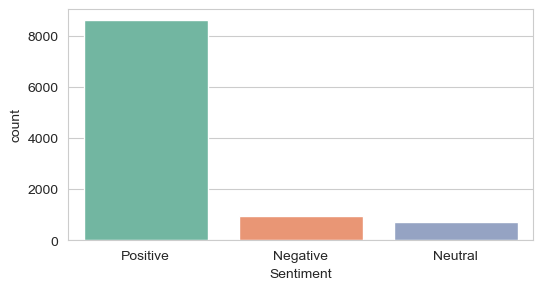

In [23]:
#visualizing 
plt.figure(figsize=(6,3))
sns.countplot(x='Sentiment',data=process_reviews)

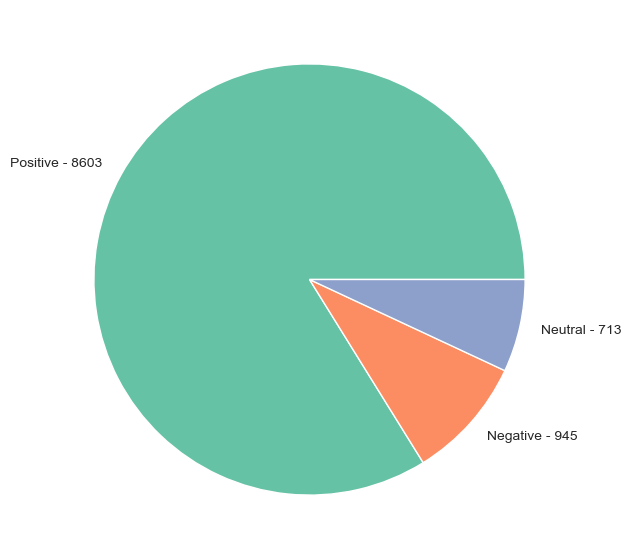

In [84]:
 # Data Visualization
Valence = ['Positive - 8603','Negative - 945','Neutral - 713']
dt = [8603,945,713]
# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(dt, labels = Valence)
# show plot
plt.show()

In [25]:
# Map negative to 0 and positive to 1
process_reviews['Sentiment'] = process_reviews['Sentiment'].map({'Negative':0, 'Positive':1,'Neutral':1})
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews,neg,neu,pos,compound,Sentiment
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,1
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,1
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,1


In [26]:
# Handling time column
# new data frame which has date and year
new = process_reviews["reviewTime"].str.split(",", n = 1, expand = True) 
  
# making separate date column from new data frame 
process_reviews["date"]= new[0] 
  
# making separate year column from new data frame 
process_reviews["year"]= new[1] 

process_reviews=process_reviews.drop(['reviewTime'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviews,neg,neu,pos,compound,Sentiment,date,year
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,1,02 28,2014
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1,03 16,2013
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0,08 28,2013
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,1,02 14,2014
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,1,02 21,2014


In [27]:
# Splitting the date 
new1 = process_reviews["date"].str.split(" ", n = 1, expand = True) 
  
# adding month to the main dataset 
process_reviews["month"]= new1[0] 
  
# adding day to the main dataset 
process_reviews["day"]= new1[1] 

process_reviews=process_reviews.drop(['date'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviews,neg,neu,pos,compound,Sentiment,year,month,day
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,1,2014,02,28
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1,2013,03,16
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0,2013,08,28
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,1,2014,02,14
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,1,2014,02,21


In [28]:
# Splitting the dataset based on comma and square bracket 
new1 = process_reviews["helpful"].str.split(",", n = 1, expand = True)
new2 = new1[0].str.split("[", n = 1, expand = True)
new3 = new1[1].str.split("]", n = 1, expand = True)

In [29]:
#Resetting the index
new2.reset_index(drop=True, inplace=True)
new3.reset_index(drop=True, inplace=True)

In [30]:
# Dropping empty columns due to splitting 
new2=new2.drop([0], axis=1)
new3=new3.drop([1], axis=1)

In [31]:
#Concatenating the splitted columns
helpful=pd.concat([new2, new3], axis=1)
helpful

,1,0
0,0,0
1,13,14
2,1,1
3,0,0
4,0,0
...,...,...
10256,0,0
10257,0,0
10258,0,0
10259,0,0


In [32]:
# I found few spaces in new3, so it is better to strip all the values to find the rate
def trim_all_columns(df):
    """
    Trim whitespace from ends of each value across all series in dataframe
    """
    trim_strings = lambda x: x.strip() if isinstance(x, str) else x
    return df.applymap(trim_strings)

In [33]:
#Applying the function
helpful= trim_all_columns(helpful)
helpful

,1,0
0,0,0
1,13,14
2,1,1
3,0,0
4,0,0
...,...,...
10256,0,0
10257,0,0
10258,0,0
10259,0,0


In [34]:
#Converting into integer types
helpful[0]=helpful[0].astype(str).astype(int)
helpful[1]=helpful[1].astype(str).astype(int)

In [35]:
#Dividing the two columns, we have 0 in the second columns when dvided gives error, so I'm ignoring those errors
try:
  helpful['result'] = helpful[1]/helpful[0]
except ZeroDivisionError:
  helpful['result']=0

In [36]:
#Filling the NaN values(created due to dividing) with 0
helpful['result'] = helpful['result'].fillna(0)

In [37]:
#Rounding of the results to two decimal places
helpful['result']=helpful['result'].round(2) 

In [38]:
#Attaching the results to a new column of the main dataframe
process_reviews['helpful_rate']=helpful['result']

In [39]:
#dropping the helpful column from main dataframe
process_reviews=process_reviews.drop(['helpful'], axis=1)


In [40]:
process_reviews.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...",5.0,1393545600,"Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,Jake,5.0,1363392000,The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""",5.0,1377648000,The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,5.0,1392940800,This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


In [41]:
process_reviews['helpful_rate'].value_counts()

0.00    7215
1.00    2040
0.50     266
0.67     136
0.75     111
        ... 
0.56       1
0.15       1
0.13       1
0.43       1
0.69       1
Name: helpful_rate, Length: 65, dtype: int64

In [42]:
# Punctuation Cleaning on review text
#Removing unnecessary columns
process_reviews=process_reviews.drop(['reviewerName','unixReviewTime'], axis=1)
#Creating a copy 
clean_reviews=process_reviews.copy()

In [43]:
clean_reviews.head()

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,"Not much to write about here, but it does exac...",0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,The product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,The primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,Nice windscreen protects my MXL mic and preven...,0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,This pop filter is great. It looks and perform...,0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


In [44]:
#NLTK libraries
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [45]:
# removed all punctuation in our review column

process_reviews['reviews']=process_reviews['reviews'].apply(lambda x:review_cleaning(x))
process_reviews.head()

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,not much to write about here but it does exact...,0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,the product does exactly as it should and is q...,0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,the primary job of this device is to block the...,0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protects my mxl mic and preven...,0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,this pop filter is great it looks and performs...,0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


In [46]:
stop_words= ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each', 
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above', 
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't", 
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from', 
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs', 
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [47]:
# Stop words removal on review text

process_reviews['reviews'] = process_reviews['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
print("removed all the stop words in the review column")
process_reviews.head()


removed all the stop words in the review column


,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,not much write but exactly supposed filters po...,0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,product exactly quite affordablei not realized...,0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,primary job device block breath would otherwis...,0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protects mxl mic prevents pops...,0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,pop filter great looks performs like studio fi...,0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


In [48]:
#tokenization on reviews text
process_reviews['reviews']=process_reviews['reviews'].apply(lambda x: x.split())
process_reviews.head()

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,"[not, much, write, but, exactly, supposed, fil...",0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,"[product, exactly, quite, affordablei, not, re...",0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,"[primary, job, device, block, breath, would, o...",0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,"[nice, windscreen, protects, mxl, mic, prevent...",0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,"[pop, filter, great, looks, performs, like, st...",0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


In [49]:
# stemming on reviews text
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()

process_reviews['reviews']= process_reviews['reviews'].apply(lambda sentence: [stemmer.stem(word) for word in sentence])

In [50]:
process_reviews

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,"[not, much, write, but, exactli, suppos, filte...",0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,"[product, exactli, quit, affordablei, not, rea...",0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,"[primari, job, devic, block, breath, would, ot...",0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,"[nice, windscreen, protect, mxl, mic, prevent,...",0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,"[pop, filter, great, look, perform, like, stud...",0.000,0.824,0.176,0.7650,1,2014,02,21,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10256,A14B2YH83ZXMPP,B00JBIVXGC,5.0,"[great, expect, thank, allfiv, star]",0.000,0.476,0.524,0.7650,1,2014,07,20,0.00
10257,A1RPTVW5VEOSI,B00JBIVXGC,5.0,"[ive, think, tri, nanoweb, string, but, bit, p...",0.046,0.805,0.148,0.9961,1,2014,07,2,0.00
10258,AWCJ12KBO5VII,B00JBIVXGC,4.0,"[tri, coat, string, past, includ, elixir, neve...",0.047,0.853,0.100,0.8164,1,2014,07,22,0.00
10259,A2Z7S8B5U4PAKJ,B00JBIVXGC,4.0,"[well, made, elixir, develop, taylor, guitar, ...",0.075,0.830,0.095,0.7517,1,2014,07,1,0.00


In [51]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
process_reviews['reviews'] =process_reviews['reviews'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])

In [52]:
process_reviews

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,"[not, much, write, but, exactli, suppos, filte...",0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,"[product, exactli, quit, affordablei, not, rea...",0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,"[primari, job, devic, block, breath, would, ot...",0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,"[nice, windscreen, protect, mxl, mic, prevent,...",0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,"[pop, filter, great, look, perform, like, stud...",0.000,0.824,0.176,0.7650,1,2014,02,21,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10256,A14B2YH83ZXMPP,B00JBIVXGC,5.0,"[great, expect, thank, allfiv, star]",0.000,0.476,0.524,0.7650,1,2014,07,20,0.00
10257,A1RPTVW5VEOSI,B00JBIVXGC,5.0,"[ive, think, tri, nanoweb, string, but, bit, p...",0.046,0.805,0.148,0.9961,1,2014,07,2,0.00
10258,AWCJ12KBO5VII,B00JBIVXGC,4.0,"[tri, coat, string, past, includ, elixir, neve...",0.047,0.853,0.100,0.8164,1,2014,07,22,0.00
10259,A2Z7S8B5U4PAKJ,B00JBIVXGC,4.0,"[well, made, elixir, develop, taylor, guitar, ...",0.075,0.830,0.095,0.7517,1,2014,07,1,0.00


In [53]:
for i in range(len(process_reviews['reviews'])):
    process_reviews['reviews'][i] = " ".join(process_reviews['reviews'][i])

C:\Users\S3-TECH\AppData\Local\Temp\ipykernel_7160\3222044629.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  process_reviews['reviews'][i] = " ".join(process_reviews['reviews'][i])


In [54]:
process_reviews.head()

,reviewerID,asin,overall,reviews,neg,neu,pos,compound,Sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,not much write but exactli suppos filter pop s...,0.057,0.790,0.153,0.6903,1,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,product exactli quit affordablei not realiz do...,0.000,0.845,0.155,0.9420,1,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,primari job devic block breath would otherwis ...,0.106,0.842,0.052,-0.5719,0,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protect mxl mic prevent pop th...,0.050,0.769,0.181,0.5859,1,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,pop filter great look perform like studio filt...,0.000,0.824,0.176,0.7650,1,2014,02,21,0.00


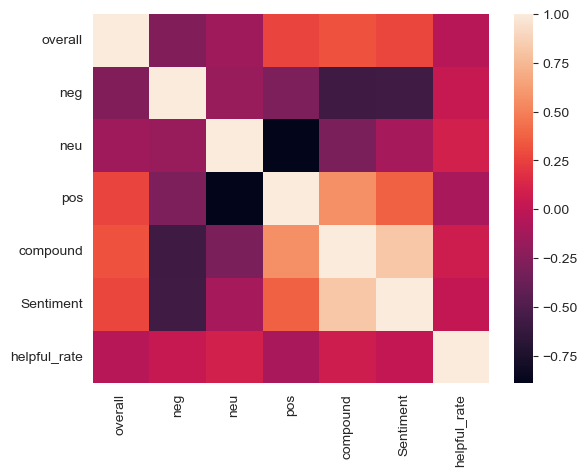

In [55]:
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(process_reviews.corr())
plt.show()

In [56]:
# from gensim.models import Word2Vec

# word2vec = Word2Vec(all_words, min_count=2)
# vocabulary = word2vec.wv.vocab
# print(vocabulary)
# v1 = word2vec.wv['reviews']


In [57]:
#feature extraction using TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
tfidf = TfidfVectorizer()
tfidfs=tfidf.fit_transform(process_reviews['reviews']).toarray()
print(tfidfs)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [58]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
model=scaler.fit(tfidfs)
scaled_data=model.transform(tfidfs)

In [59]:
scaled_data

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [60]:
x=tfidfs
y=process_reviews['Sentiment']

In [61]:
print(x)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [62]:
y

0        1
1        1
2        0
3        1
4        1
        ..
10256    1
10257    1
10258    1
10259    1
10260    1
Name: Sentiment, Length: 10261, dtype: int64

In [63]:
from sklearn.model_selection import train_test_split
x_train , x_test, y_train , y_test = train_test_split(x, y ,test_size=0.30, random_state=40)

In [64]:
print(x_train)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [65]:
print(x_test)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [66]:
print(y_train)

1809    1
1401    1
872     0
8560    1
8478    1
       ..
7839    1
3603    1
5959    1
5426    0
7608    1
Name: Sentiment, Length: 7182, dtype: int64


In [67]:
print(y_test)

3010    1
5367    1
8462    1
5698    1
546     1
       ..
1150    1
1616    1
4130    1
2719    1
3321    1
Name: Sentiment, Length: 3079, dtype: int64


In [68]:
# # Fitting Naive Bayes to the Training set 
# from sklearn.ensemble import BaggingClassifier
# from sklearn.naive_bayes import GaussianNB  
# from sklearn import metrics
# classifier = BaggingClassifier(GaussianNB())
# classifier.fit(x_train, y_train)  
# y_pred = classifier.predict(x_test)
# print('\nPrecision: ' + str(metrics.precision_score(y_test, y_pred,average='macro')))
# print('Accuracy: ' + str(metrics.accuracy_score(y_test, y_pred)))
# print('Recall: ' + str(metrics.recall_score(y_test, y_pred,average='macro')))
# print('F1-score: ' + str(metrics.f1_score(y_test, y_pred,average='macro')))

In [69]:
 from sklearn.ensemble import BaggingClassifier

Accuracy:  0.9175056836635271
Precision:  0.45890188434048085
Recall:  0.4998230714791224
F1:  0.4784891598915989
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       253
           1       0.92      1.00      0.96      2826

    accuracy                           0.92      3079
   macro avg       0.46      0.50      0.48      3079
weighted avg       0.84      0.92      0.88      3079


Confusion Matrix: 
[[   0  253]
 [   1 2825]]


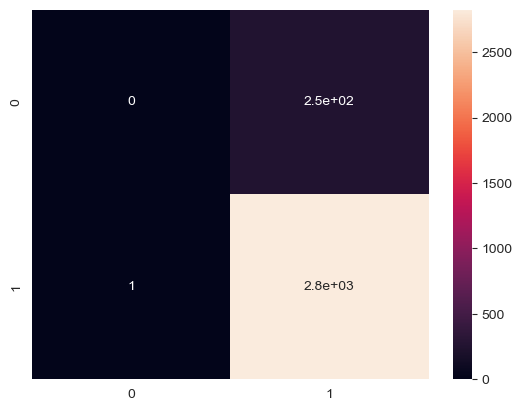

In [70]:
from sklearn.naive_bayes import MultinomialNB
import seaborn as sns
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
naive=MultinomialNB()
naive.fit(x_train, y_train)
y_pred=naive.predict(x_test)
print("Accuracy: ",metrics.accuracy_score(y_test,y_pred))
print("Precision: ",metrics.precision_score(y_test,y_pred,average="macro"))
print("Recall: ",metrics.recall_score(y_test,y_pred,average="macro"))
print("F1: ",metrics.f1_score(y_test,y_pred,average="macro"))
Mn_acc = metrics.accuracy_score(y_test, y_pred)
print(classification_report(y_test,y_pred))
#display confusion matrix
print('\nConfusion Matrix: \n' + str(metrics.confusion_matrix(y_test, y_pred)))
#plot confusion matrix
sns.heatmap(metrics.confusion_matrix(y_test, y_pred), annot = True)
plt.show()

In [79]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train , y_train)
y_pred = dt.predict(x_test)
dt_score = metrics.accuracy_score(y_test,y_pred)
dt_score

0.8772328678142254

In [80]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
y_predd=dt.predict(x_test)
rf_score=metrics.accuracy_score(y_test,y_predd)

In [81]:
rf_score

0.8772328678142254

In [82]:
#Model comparision
models=pd.DataFrame({'Model':['MultinomialNB','Decision Tree','Random Forest'],'Score':[Mn_acc,dt_score,rf_score]})
models.sort_values(by='Score', ascending=False)

,Model,Score
0,MultinomialNB,0.917506
1,Decision Tree,0.877233
2,Random Forest,0.877233


In [83]:
import plotly.express as px
px.bar(data_frame = models, x='Score', y='Model', color='Score',template='plotly_dark', title='Model Comparision')
